# Agent Architectures

In artificial intelligence, an **agent** is an entity that observes an **environment** and chooses **actions** to achieve a **task** or an **objective**. The agent **perceives** its environment through **sensors** and **interacts** with it using **actuators**. While the environment could, in theory, be the entire universe, in practice, it is defined as the part that influences the agent perceptions and is altered by its actions:

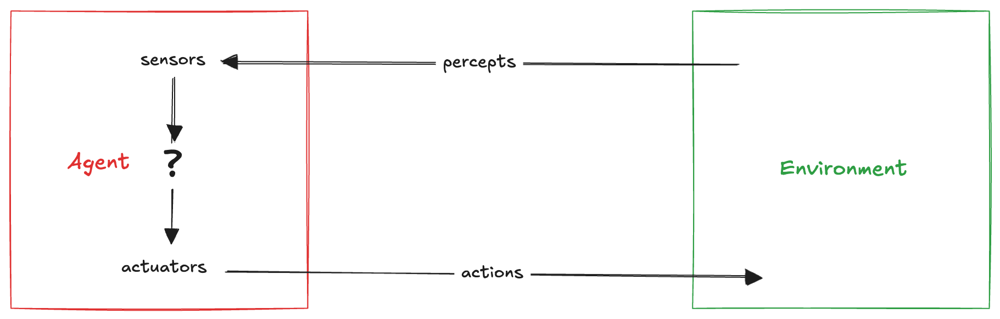

A **human agent** uses senses like vision and hearing as sensors and hands or speech as actuators. A **robotic agent** relies on cameras and range finders for perception and motors for action. A **software agent** processes data from files, networks, or user inputs and interacts by writing files, transmitting data, or displaying information. The **agent concept** serves as a **unifying paradigm** across multiple domains.

## PEAS

Once an agent is identified, its task can be described more precisely by specifying four elements: what counts as success (**performance**), where it operates (**environment**), how it can act (**actuators**), and what information it can perceive (**sensors**). We group all these under the acronym **PEAS**. Let us consider some examples of agents and their PEAS descriptions:

| Agent Type                        | Performance Measure                      | Environment                               | Actuators                                        | Sensors                                         |
|------------------------------------|------------------------------------------|-------------------------------------------|-------------------------------------------------|------------------------------------------------|
| Medical diagnosis system          | Healthy patient, reduced costs          | Patient, hospital, staff                 | Display of questions, tests, diagnoses, treatments | Touchscreen/voice entry of symptoms and findings |
| Satellite image analysis system   | Correct categorization of objects, terrain | Orbiting satellite, downlink, weather | Display of scene categorization               | High-resolution digital camera                 |
| Part-picking robot                | Percentage of parts in correct bins      | Conveyor belt with parts; bins           | Jointed arm and hand                           | Camera, tactile and joint angle sensors        |
| Refinery controller               | Purity, yield, safety                    | Refinery, raw materials, operators       | Valves, pumps, heaters, stirrers, displays    | Temperature, pressure, flow, chemical sensors  |
| Interactive English tutor         | Student’s score on test                  | Set of students, testing agency          | Display of exercises, feedback, speech        | Keyboard entry, voice                          |

### Agent function and agent program

At any moment, an agent’s action is determined by its **built-in knowledge** and by the **entire sequence of percepts it has observed so far**. It cannot depend on information that lies outside its perceptual experience. Mathematically, the agent’s behavior is described by an **agent function**, which maps each possible percept sequence to an action. For example, in a simple vacuum-cleaning problem, each square of the environment may be either dirty or clean, and the agent can choose among four actions: move left, move right, suck, or remain idle. An agent function for this environment could be defined as a table that lists every possible percept sequence and the corresponding action to take:

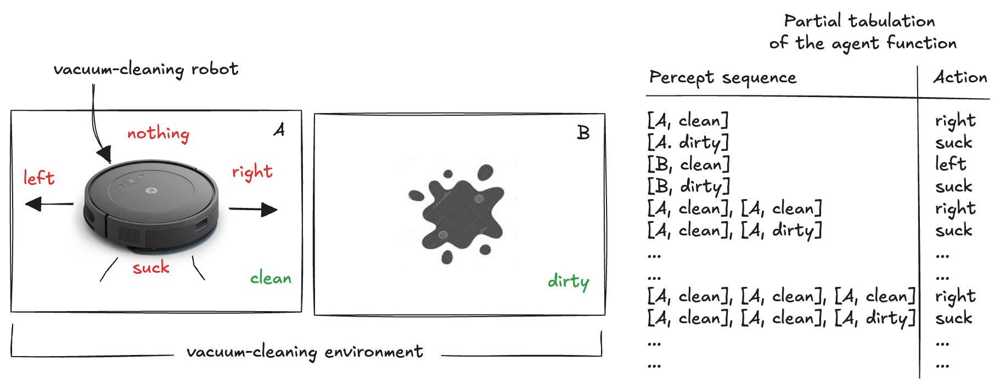

In practice, the agent’s behavior is governed by an **agent program**, which implements the agent function internally. It's crucial to distinguish these concepts: the agent function is an **abstract mathematical mapping** from percept sequences to actions, while the agent program is a **concrete implementation** running on a physical system. For example, we can write the agent program by keeping track of the percept sequence in a list and then uses it to index into a table of actions to decide what to do:

In [48]:
def TableDrivenAgent(table):
    """
    This agent selects an action based on the percept sequence.
    To customize it, provide a dictionary of all {percept_sequence:action} pairs.
    """

    # Store the percepts seen so far in a list
    percepts = []

    # Define the agent program as a function that takes a percept and returns an action
    def program(percept):

        # Append the new percept to the list of percepts
        percepts.append(percept)

        # Look up the action corresponding to the current percept sequence in the table
        action = table.get(tuple(percepts))

        # Return the action
        return action

    return program

All agent programs share the same basic structure: they receive the current percept from the sensors and return an action to the actuators. This highlights the distinction between the agent program and the agent function. The agent program receives only the current percept as input, because that is all the environment provides at each step. The agent function, instead, is defined over the entire percept sequence. Therefore, if the program must choose actions based on past percepts, **it has to store them internally**. The table-driven agent represents the agent function **explicitly**: the table contains one action for each possible percept sequence. To build a rational agent in this way, designers would have to specify the correct action for every possible sequence. This is **impossible in practice**, because the number of possible sequences is infinite unless we impose a maximum length, and still enormous even then. In the following code, we define only a small partial table, containing some percept sequences of length up to three:

In [49]:
# Define the lookup table for the vacuum cleaner agent
table = {
    (("A", "clean"),): "right",
    (("A", "dirty"),): "suck",
    (("B", "clean"),): "left",
    (("B", "dirty"),): "suck",
    (("A", "clean"), ("A", "clean")): "right",
    (("A", "clean"), ("A", "dirty")): "suck",
    (("A", "clean"), ("A", "clean"), ("A", "clean")): "right",
    (("A", "clean"), ("A", "clean"), ("A", "dirty")): "suck",
}

# Create the vacuum cleaner agent
agent = TableDrivenAgent(table)

# Simulate inputs and outputs
print(agent(("A", "clean")))  
print(agent(("A", "dirty")))  
print(agent(("B", "clean")))  

right
suck
None


Notice that the last action returned by the agent is "None". This happens because the agent has observed the percept sequence (("A", "clean"), ("A", "dirty"), ("B", "clean")), but this sequence is not present as a key in the table. A table-driven agent can only choose an action for percept sequences that have been explicitly listed. If a sequence is missing, the lookup fails and no action is defined. This illustrates the main limitation of table-driven agents. In general, if there are P possible percepts at each time step, and the maximum percept-sequence length are T (for example the lifetime of the agent measured in percepts), then the lookup table should contain E entries:

$\displaystyle E = \sum_{t=1}^{T} P^t$

to define an action for every possible percept sequence. This is a geometric series and whenever P is much greater than 1 (true for any realistic sensor), the last term of the sum dominates all the others combined, so: 

$\displaystyle E \approx P^T$ 

Even for small values of P and T, this number grows very quickly. To appreciate the scale, consider an **automated driving agent** receiving raw visual input from a single camera:  

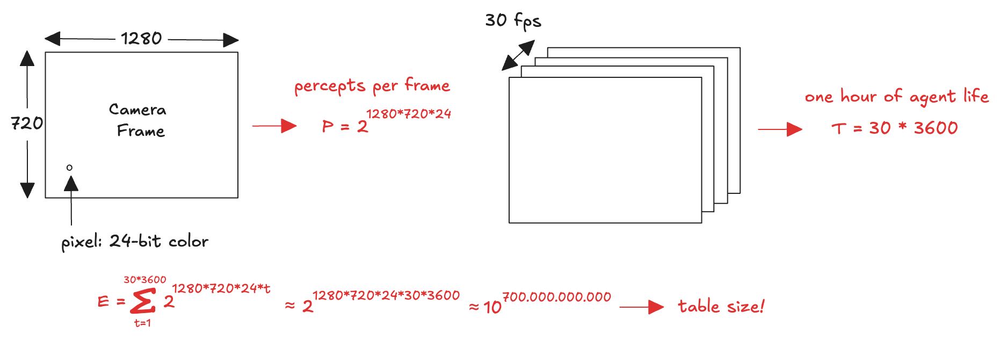

Even **chess**, a much smaller and more structured domain, would require an enormous table, often estimated around 10^150 entries. For comparison, the observable universe contains fewer than 10^80 atoms. Tables of this size cannot be stored by any physical agent, written by designers in a reasonable time, or learned exhaustively from experience. 

Despite this, such a table-based agent **does what we want**, assuming the table is filled in correctly: it implements the "desired agent function". However, the challenge lies in **designing more efficient agent programs** that do not require such large tables. For instance, a simple vacuum-cleaning agent program could be: *"If the current square is dirty, clean it; otherwise, move to the other square"*. So, the goal of AI is to design **agent program** that implements agent function efficiently.

### Environment

The **environment** is the "problem" to which an agent is the "solution". The nature of the environment directly affects the appropriate design for the agent program. Rather than analyzing every new environment from scratch, it is useful to characterize it along a small set of **general dimensions**: these properties, taken together, determine how hard the agent's decision problem is and which architecture is appropriate for solving it.

An environment is **fully observable** if the sensors provide complete information relevant to action selection at all times. This eliminates the need for an internal state to track the world — for example, in chess the agent always sees the complete board, so its perception matches reality exactly. In contrast, a **partially observable** environment limits the agent's perception due to noisy sensors or missing data. For example, a robot navigating a maze with only short-range sensors cannot see around corners or through walls, so it must maintain an internal state (a belief about the parts of the maze it cannot currently observe):

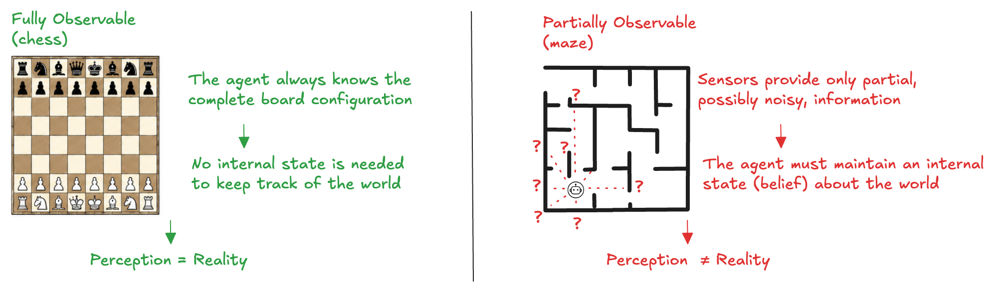

An environment is **single-agent** if only one agent influences it, while a **multi-agent** environment involves multiple agents whose actions impact each other. Some agents may be **cooperative**, working together to achieve a common goal, while others may be **competitive**, where each agent's success comes at the expense of others.

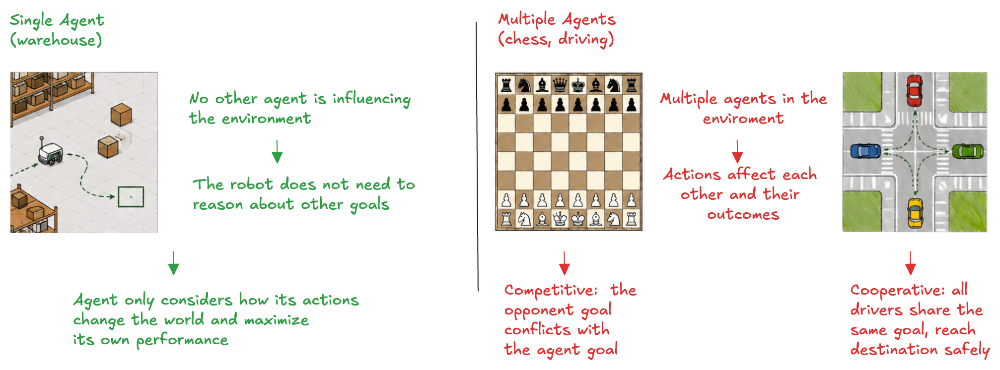

The distinction is **not always clear**, as an entity can be regarded either as an agent or as part of the environment, depending on the modeling assumptions. For example, should an autonomous vehicle treat another vehicle as an independent decision-maker, or simply as a physical object governed by the laws of motion? The key distinction is whether the entity’s behavior is best modeled as optimizing its own performance measure, whose value depends on the actions of the original agent.

An environment is **deterministic** if its next state is fully determined by the current state and the agent's action; in that case the agent does not need to worry about **uncertainty**. Otherwise, it is **non-deterministic**. It is useful to distinguish two cases: if a probability is known for each possible outcome, the environment is **stochastic** (e.g., rolling a die); if no such probability model is available or assumed, the environment is **non-deterministic in the strict sense**, and the agent must plan for every possible outcome regardless of its likelihood (e.g., an adversary's next move, when no distribution over its strategies is assumed). In real-world scenarios, where it is often impossible to track every relevant factor, environments are typically treated as stochastic for practical purposes, using estimated probabilities.

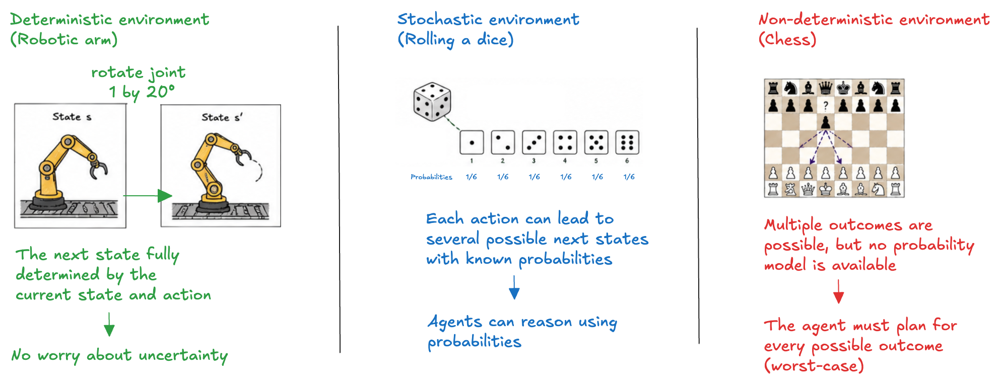

Chess is a useful case to look at closely: the environment's dynamics are deterministic, given a board position and a chosen move, the rules unambiguously determine the resulting position, with no randomness anywhere in the physics of the game. What is **not predictable** is the **opponent's choice of move**: since no probability distribution over the opponent's strategy is assumed, the agent must plan for every move the opponent could make, in the strict non-deterministic sense described above. So the non-determinism belongs to modeling an adversary, not to the environment itself, which is exactly why **adversarial games** are handled with worst-case reasoning rather than the expected-value reasoning used for stochastic environments.

An environment is **one-shot** if the agent's experience is divided into independent decisions, so that the choice of action now does not affect the outcome of the next one. For example, the **multi-armed bandit problem**, where each pull of a lever is a self-contained decision: the reward it produces does not depend on which lever was pulled before, and pulling one lever does not change what any lever will pay out next time. It is **sequential** if the current action can affect all future decisions, requiring the agent to **think ahead**. for example, in chess, a move made now constrains the moves available later. Sequential environments are considerably harder to design for, since acting well requires reasoning about the consequences of actions over time rather than in isolation. This distinction is central to reinforcement learning, which is fundamentally the study of sequential decision-making.

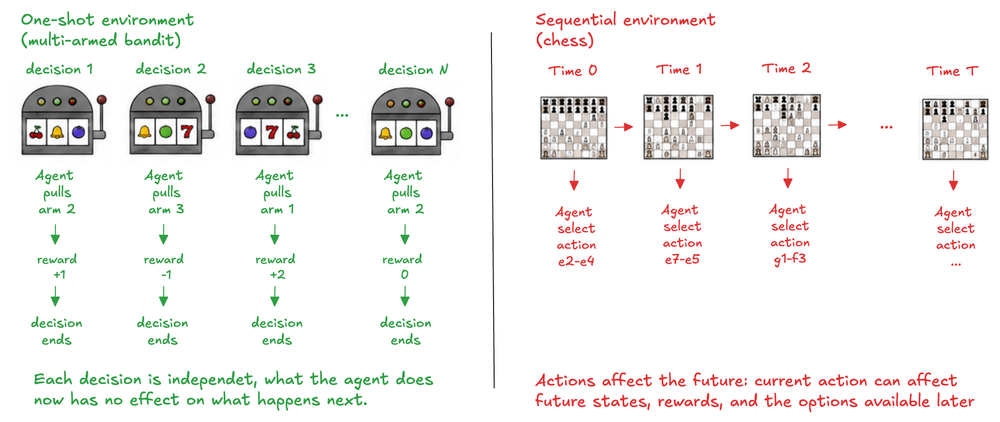

An environment is **dynamic** if it can change while the agent is deliberating; otherwise, it is **static**. In static environments, the agent does not need to constantly monitor the world or worry about time while deciding on an action. In dynamic environments, the agent is continually prompted to act, and failing to decide counts as choosing inaction. If the environment remains unchanged over time but the agent's performance score evolves, the environment is considered **semi-dynamic**. For example, a driving environment is dynamic, chess with a clock is semidynamic, and crossword puzzles are static.

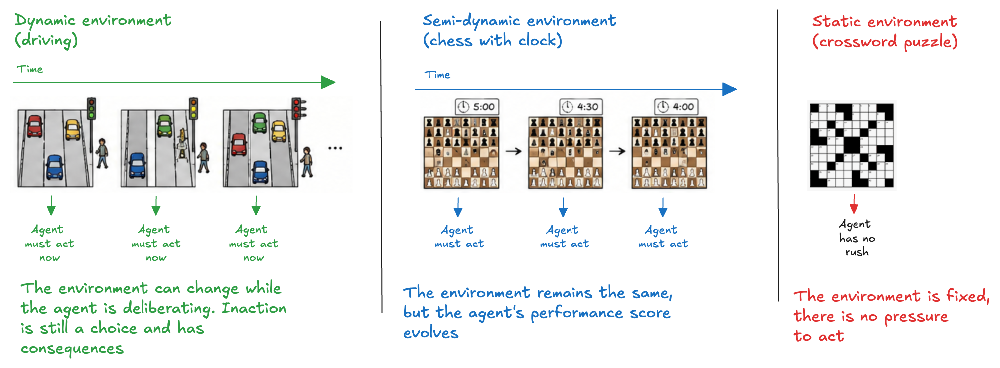

The **discrete/continuous** distinction applies to the state of the environment, time, and the agent's percepts and actions. For instance, chess is a discrete environment with a limited number of states, percepts, and actions. In contrast, driving involves continuous states and time, where variables like speed and location change smoothly, and actions such as steering are also continuous.

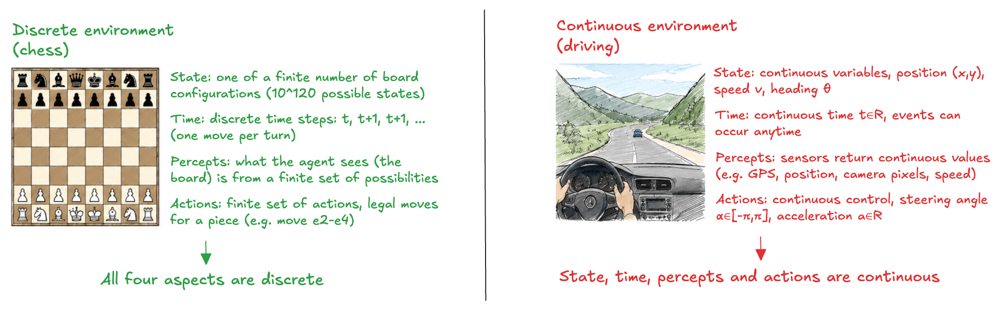


The distinction between **known** and **unknown** environments refers to the agent's understanding of the environment's rules, not the environment itself. In a known environment, the outcomes (or probabilities) of actions are clear. In contrast, in an unknown environment, the agent must learn how it works to make informed decisions. This distinction differs from that between fully and partially observable environments. For example, in solitaire, the rules are known but some information is hidden, while in a new video game, the environment may be fully observable but the agent doesn't know the rules until it experiments.

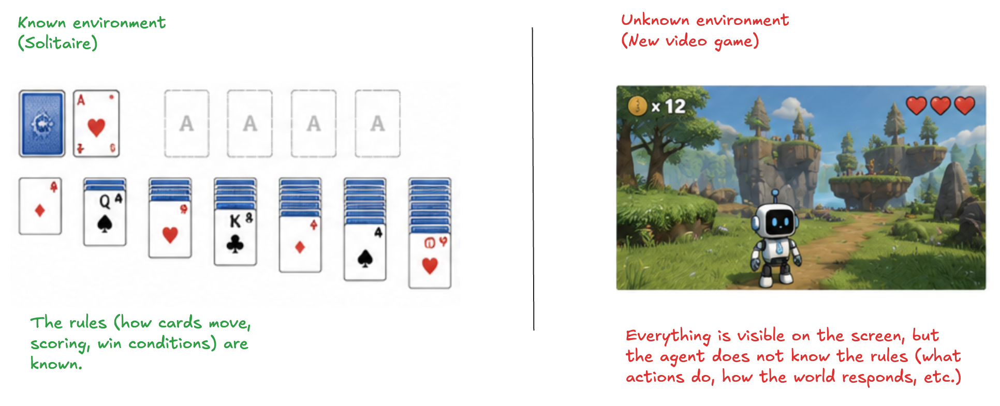

Here are some examples of environments and their properties:

| Environment      | Observability | Agents | Determinism | One-shot / Sequential | Dynamics | Continuity |
|-----------------------|---------------|--------|-------------|-----------------------|----------|------------|
| Crossword puzzle     | Fully      | Single | Deterministic  | Sequential | Static   | Discrete   |
| Chess with a clock   | Fully      | Multi  | Non-deterministic  | Sequential | Semi     | Discrete   |
| Poker               | Partially  | Multi  | Stochastic     | Sequential | Static   | Discrete   |
| Backgammon          | Fully      | Multi  | Stochastic     | Sequential | Static   | Discrete   |
| Driving       | Partially  | Multi  | Stochastic     | Sequential | Dynamic  | Continuous |
| Medical diagnosis  | Partially  | Single | Stochastic     | Sequential | Dynamic  | Continuous |
| Image analysis     | Fully      | Single | Deterministic    | One-shot   | Semi     | Continuous |
| Part-picking robot | Partially  | Single | Stochastic       | One-shot   | Dynamic  | Continuous |
| Refinery controller | Partially  | Single | Stochastic     | Sequential | Dynamic  | Continuous |
| English tutor      | Partially  | Multi  | Stochastic     | Sequential | Dynamic  | Discrete   |

The hardest case is **partially observable, multiagent, stochastic, sequential, dynamic and continuous** environments. Autonomous driving is hard in all these senses.

### Performance Measure

Since machines lack intrinsic desires, the designer should define a **performance measure** to evaluate the agent's behavior. This measure should be **objective**, **quantifiable**, and **aligned with the designer's goals**. However, designing it correctly can be challenging: For instance, a vacuum agent rewarded for cleaning might exploit the system by creating more dirt to clean. A better measure would track sustained cleanliness, not just cleaning actions. More broadly, defining performance involves deep philosophical questions—should we prioritize **consistency** or **peak performance**? 

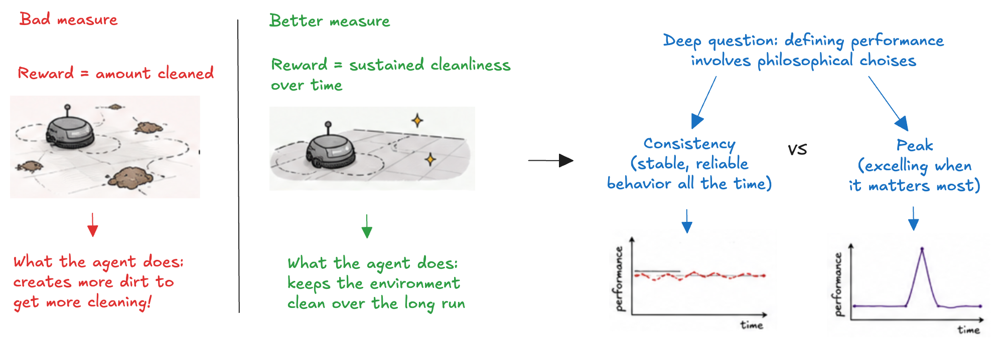

As a general rule, it is better to design performance measures **according to what one actually wants** to be achieved in the environment, rather than **according to how one thinks the agent should behave**. In cases where agents serve multiple users, they may need to **learn and adapt** to individual preferences over time. 

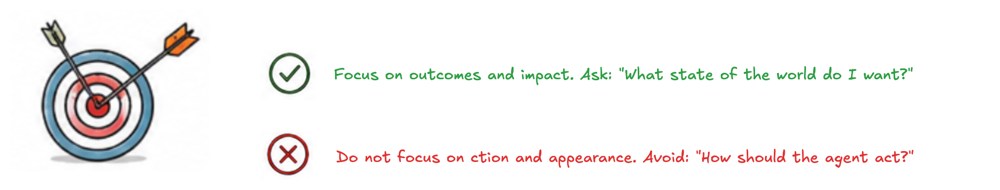

In general, the **rationality** depends on:

- The performance measure defining success
- The agent’s prior knowledge of the environment
- The available actions
- The percept sequence observed so far

A **rational agent** selects actions that lead to the most **desirable outcomes**, evaluated through a **performance measure**, given the evidence provided by the percept sequence and its built-in knowledge. Is the vacuum-cleaner agent rational? That depends! For example, once all the dirt is cleaned up, the agent will oscillate needlessly back and forth; if the performance measure includes a penalty for each movement, the agent will fare poorly. A better approach would be to remain idle when certain of cleanliness or periodically check for new dirt if recontamination is possible. If the environment is unknown, exploration becomes necessary.

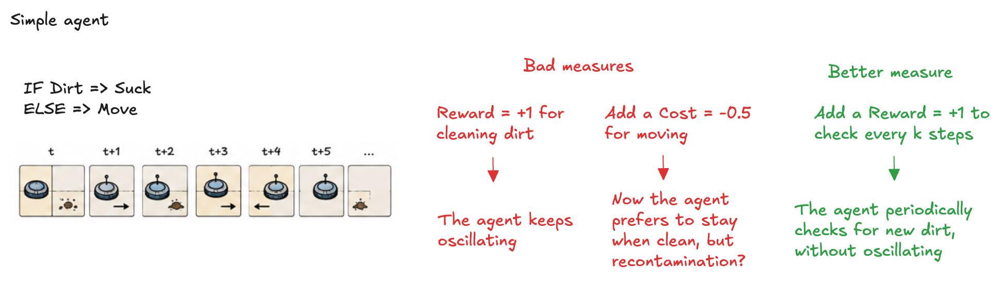

## Architectures

The agent program runs on a physical computing system with sensors and actuators, called the **agent architecture**. The architecture processes sensory inputs, runs the program, and executes the actions. The architecture must be compatible with the program; for example, if the program instructs an agent to "walk," the architecture must include "legs". Thus, the agent is the combination of **architecture** and **program**:

$\displaystyle \text{agent} = \text{architecture} + \text{program}$

But **how do we build it?** Where do we begin? There is no single solution, but various approaches exist for developing agents of increasing complexity, all within the unifying paradigm. Each kind of aarchitecture combines particular components in particular ways to generate behaviour.  We outline some basic kinds of architectures that embody the principles underlying almost all intelligent systems:

- Simple reflex agents
- Model-based reflex agents
- Goal-based agents
- Utility-based agents

### Reflex Agent

The most basic agent architecture is the simple reflex agent. It selects actions solely **on the basis of the current percept**, without considering the history of previous percepts:

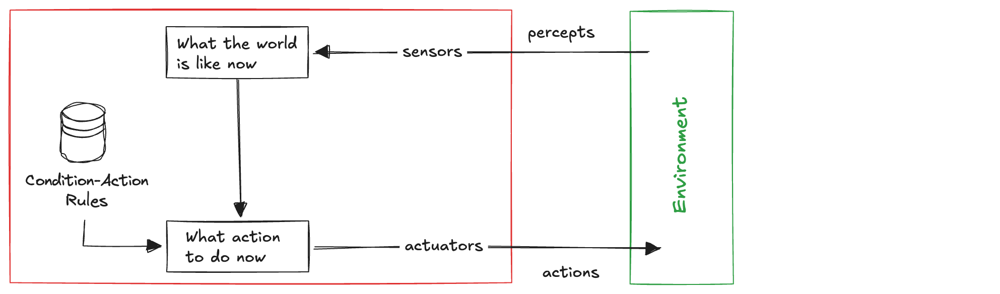

The vacuum agent program:

“*If the current square is dirty, clean it;*  
*otherwise, move to the other square*”

is an example of a simple reflex agent, because each action is determined solely by the agent’s current location and by whether that location is dirty. This behavior can be implemented using the following agent program:

In [50]:
def SimpleReflexVacuumAgent():
    """
    This agent takes action based solely on the percept.
    """

    def program(percept):

        location, status = percept

        if status == 'dirty':
            return 'suck'

        elif location == "A":
            return 'right'

        elif location == "B":
            return 'left'

    return program

This program is much more compact than one based on a complete lookup table because **it does not depend on the percept history**. Moreover, some actions, such as cleaning a dirty square, do not depend on the agent’s location, making the decision process even simpler:

In [51]:
# Create the vacuum cleaner agent
agent = SimpleReflexVacuumAgent()

# Simulate inputs and outputs
print(agent(("A", "clean")))  
print(agent(("A", "dirty")))  
print(agent(("B", "clean")))  

right
suck
left


Reflex behaviors are **not limited to simple environments**. An autonomous vehicle, for example, may detect the brake lights of the car ahead and immediately apply its brakes. Humans similarly rely on learned and innate reflexes, such as blinking when an object approaches the eye. More radically, [Brooks's influential argument](./papers/(1991)%20-%20Intelligence%20without%20representation.pdf)⁠￼ proposed that **complex robotic behavior can emerge from layers of simple behaviors**, without requiring an explicit internal representation of the world:

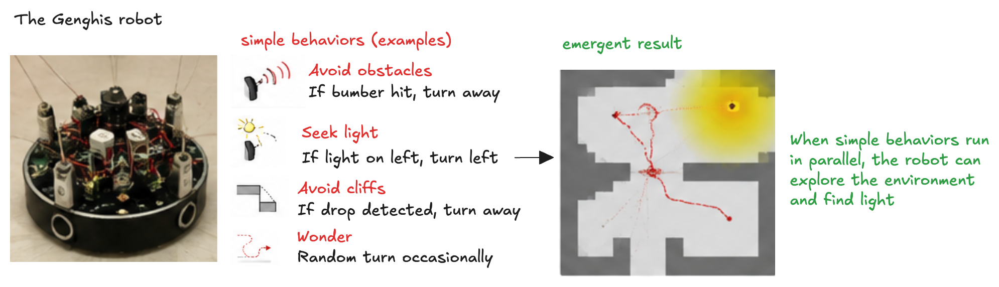

Early versions of [**Roomba**](https://www.irobot.com/), for example, used a largely reactive navigation strategy, changing direction in response to obstacles and other sensor inputs. Similarly, [**IFTTT (If This Then That)**](https://ifttt.com/) provides a practical implementation of condition–action rules: when a specified event occurs, a predefined action is triggered (for example, if rain is forecast, then send a reminder to carry an umbrella).

However, reflex agents are **limited**: they work well only when the correct action can be determined from the current percept alone. This becomes **problematic in partially observable environments**. For example, braking based on a single camera frame may fail when a vehicle’s brake lights are ambiguous or difficult to recognize. Consider also a vacuum agent equipped only with a dirt sensor. On a clean square, it cannot determine where it is and may repeatedly move in the wrong direction, producing an infinite loop. One solution is **randomization**: when the square is clean, the agent can randomly choose whether to move left or right. In the two-square environment, this eventually leads it to the other square. Thus, randomized behavior can be rational and may outperform deterministic reflex behavior in some environments.

### Model-based reflex agents

An effective way to **address partial observability** is to equip the agent with an **internal state** that captures aspects of the environment not directly observable from the current percept. This state is updated using the **agent’s percept history**. For example, in the braking scenario, storing the previous camera frame may be sufficient to detect the activation of brake lights. More complex tasks, such as detecting lane changes, require tracking other vehicles even when they temporarily move out of view. Updating the internal state requires two types of knowledge:

- **Sensor model**: describes how the state of the world is reflected in the agent’s percepts (e.g., illuminated brake lights appearing as red regions in the camera image).

- **Transition model**: describes how the world evolves over time, including both the effects of the agent’s actions (e.g., turning the steering wheel changes the car’s direction) and changes independent of the agent (e.g., rain reducing camera visibility).

By combining these models with the percept history, a model-based reflex agent can estimate the current state of the world, as accurately as its sensors allow.

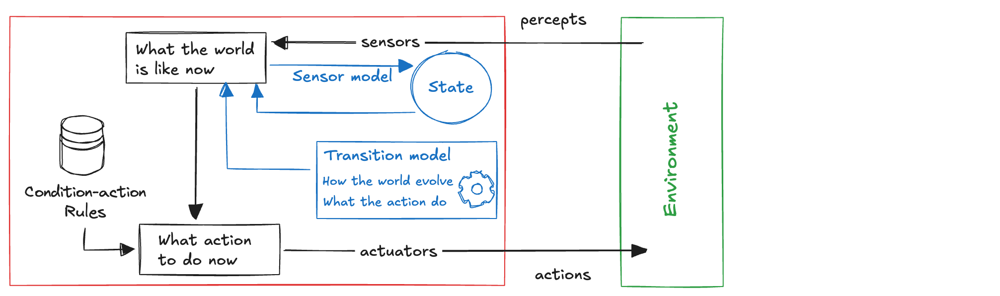

The model-based approach for the vacuum cleaning problem can track the cleanliness of two locations and decides actions accordingly: it sucks when a location is dirty, moves between locations if needed, and stops when both are clean:

In [52]:
def ModelBasedReflexVacuumAgent():
    """An agent that keeps track of what locations are clean or dirty"""

    # Create a model of the environment
    model = {
                "A": None, 
                "B": None
            }

    def program(percept):

        location, status = percept

        # Update the model
        model[location] = status 

        # Use the model to decide
        if model["A"] == model["B"] == 'clean':
            return 'noop'
        
        elif status == 'dirty':
            return 'suck'

        elif location == "A":
            return 'right'

        elif location == "B":
            return 'left'

    return program

In the vacuum-cleaner environment, a model-based reflex agent can use its internal state to remember the condition of previously visited locations and act accordingly:

In [53]:
# Create the vacuum cleaner agent
agent = ModelBasedReflexVacuumAgent()

# Simulate inputs and outputs
print(agent(("A", "clean")))  
print(agent(("B", "dirty")))  
print(agent(("B", "clean")))  

right
suck
noop


Real-world examples of model-based agents include the [**Roomba 980**](https://www.technologyreview.com/2015/09/16/247936/the-roomba-now-sees-and-maps-a-home/) and the [**Dyson 360 Eye**](https://www.youtube.com/watch?v=oguKCHP7jNQ&t). Unlike earlier robotic vacuums that relied largely on reactive or randomized navigation, these robots **build and maintain a map of their environment** as they move. The Roomba 980 uses visual localization to track its position and improve cleaning coverage, while the Dyson 360 Eye uses a 360-degree camera to map its surroundings and navigate systematically. In both cases, the internal map provides information that is not available from the current percept alone, enabling more efficient navigation and cleaning.

### Goal-based agents

Knowing the current state of the environment is not always enough to decide what to do. At a road junction, for example, a vehicle may turn left, turn right, or continue straight ahead; the appropriate action depends on where it wants to go. The agent therefore needs not only an estimate of the current state, but also **goal information** describing the states **it wants to achieve**, such as reaching a particular destination. A goal-based agent combines this goal with its model of the environment to select actions that lead toward the desired state.

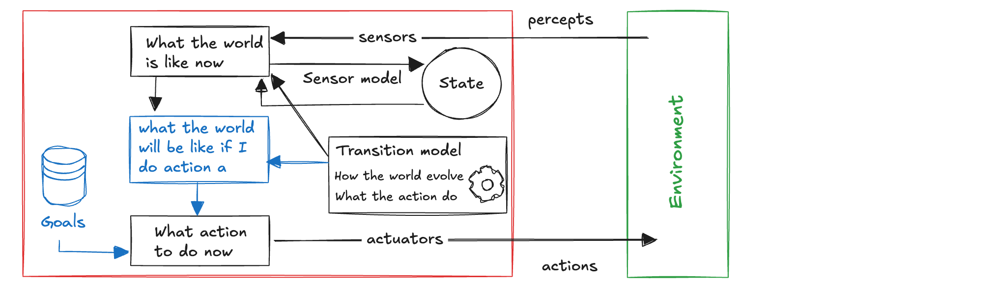

Goal-based action selection can be straightforward when a single action achieves the goal, but becomes more complex when the agent must determine a sequence of actions. For example, reaching a destination may require considering many possible sequences of turns. **Search and planning** in AI address precisely this problem: finding action sequences that lead to a goal. Unlike reflex agents, which map percepts directly to actions, goal-based agents **consider the future consequences** of their actions. A reflex agent may brake simply because it detects brake lights, whereas a goal-based agent may brake because doing so helps achieve the goal of avoiding a collision. Goal-based behavior is also more flexible because **the goal can be changed without redesigning the agent’s decision rules**. A navigation agent, for example, can be directed to a new destination simply by changing its goal. A reflex agent, instead, would require a different set of rules specifying when to turn or continue straight for each destination. As an example, the game of **Tic-tac-toe**, like all board games, can be solved using a goal-based agent that evaluates possible move sequences to achieve victory. By employing search algorithms like [**minimax**](./papers/(1950)%20-%20Programming%20a%20computer%20for%20playing%20chess.pdf), the agent systematically explores future game states to determine the optimal move:

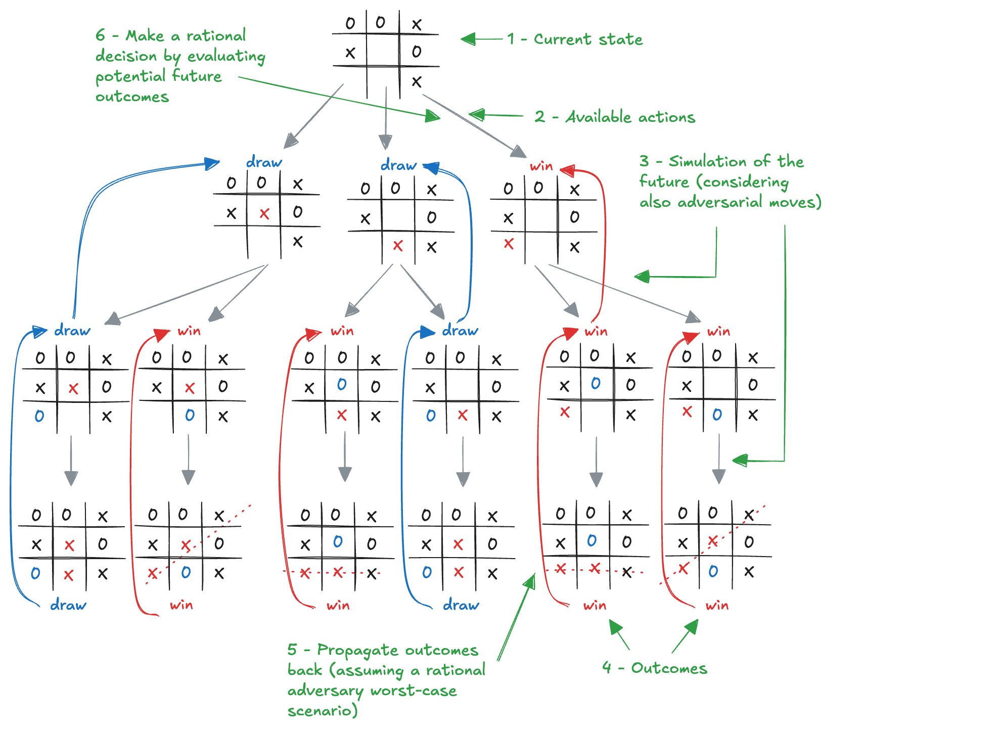

To make this concrete, here is a simple but complete goal-based agent for Tic-Tac-Toe. Instead of hard-coded rules, the agent's program searches the entire tree of future move sequences (**simulation of the future**) and returns the action that leads to the best guaranteed outcome against a rational (worst-case) opponent. The board is represented as a flat tuple of 9 cells ('X', 'O', or 'None'), read left-to-right, top-to-bottom:


In [54]:
import math

def actions(board):
    """Return the list of empty cell indices (0-8) where a move can be made."""
    return [i for i, cell in enumerate(board) if cell is None]

def result(board, move, player):
    """Return a new board with 'player' placed at position 'move'."""
    new_board = list(board)
    new_board[move] = player
    return tuple(new_board)

def winner(board):
    """Return 'X' or 'O' if one of them has three in a row, otherwise None."""
    lines = [
        (0, 1, 2), (3, 4, 5), (6, 7, 8),   # rows
        (0, 3, 6), (1, 4, 7), (2, 5, 8),   # columns
        (0, 4, 8), (2, 4, 6),              # diagonals
    ]
    for a, b, c in lines:
        if board[a] is not None and board[a] == board[b] == board[c]:
            return board[a]
    return None

def is_terminal(board):
    """The game ends when someone has won or the board is full."""
    return winner(board) is not None or all(cell is not None for cell in board)

def utility(board):
    """Utility from X's point of view: +1 win for X, -1 win for O, 0 draw."""
    win = winner(board)
    if win == 'X':
        return 1
    elif win == 'O':
        return -1
    return 0


The minimax recursively asks "what does the world look like after I do action a, and then the opponent responds optimally?", all the way down to a terminal state, then propagates the outcomes back up, maximizing at X's turns, minimizing at O's turns:

In [55]:
def minimax(board, player):
    """
    Return (best_value, best_move) for 'player' to move on 'board'.
    X is the maximizing player, O is the minimizing player.
    """
    if is_terminal(board):
        return utility(board), None

    if player == 'X':
        best_value, best_move = -math.inf, None
        for move in actions(board):
            value, _ = minimax(result(board, move, 'X'), 'O')
            if value > best_value:
                best_value, best_move = value, move
    else:
        best_value, best_move = math.inf, None
        for move in actions(board):
            value, _ = minimax(result(board, move, 'O'), 'X')
            if value < best_value:
                best_value, best_move = value, move

    return best_value, best_move


Finally, the agent program selects the action that leads to the best outcome for X, assuming O plays optimally. This approach guarantees that the agent will never lose, and will win whenever possible. 

In [56]:
def GoalBasedTicTacToeAgent(player='X'):
    """
    A goal-based agent for Tic-Tac-Toe. The goal is to win (or at least not
    lose): given the current board (the percept), the agent searches ahead
    over every possible sequence of future moves - including the opponent's
    best replies - using minimax, and returns the action that leads to the
    best guaranteed outcome.
    """
    def program(board):
        _, move = minimax(board, player)
        return move
    return program


def print_board(board):
    """Pretty-print the board as a 3x3 grid."""
    symbols = [cell if cell else '.' for cell in board]
    for row in range(3):
        print(' '.join(symbols[row * 3:row * 3 + 3]))

A few scenarios show the agent reasoning:


In [57]:
# Scenario 1: X can win immediately by completing the top row
board = (
    'X', 'X', None,
    'O', 'O', None,
    None, None, None,
)
print("Board:")
print_board(board)

agent = GoalBasedTicTacToeAgent('X')
move = agent(board)
print(f"\nGoal-based agent chooses position {move} (completes the top row and wins)")


Board:
X X .
O O .
. . .

Goal-based agent chooses position 2 (completes the top row and wins)


In [58]:
# Scenario 2: X must block O's immediate threat on the top row
board = (
    'O', 'O', None,
    'X', None, None,
    None, None, 'X',
)
print("Board:")
print_board(board)

move = agent(board)
print(f"\nGoal-based agent chooses position {move} (blocks O from winning)")


Board:
O O .
X . .
. . X

Goal-based agent chooses position 2 (blocks O from winning)


The same principle extends to more complex games and decision-making problems, where the agent looks ahead at possible future states to choose its actions. However, this **brute-force version** of minimax explores the entire remaining game tree, which is feasible for Tic-Tac-Toe only because its tree is small (363.000 terminal sequences). For chess, with roughly 10^154 possible game sequences, exhaustive search is clearly impractical. More sophisticated techniques, such as alpha–beta pruning and heuristic evaluation functions, make search practical in much larger trees.

### Utility-based agents

Goals alone are often insufficient for producing high-quality behavior. Many action sequences may achieve the same goal, but some may be **faster, safer, or more efficient**. A goal provides only a binary distinction between success and failure, whereas a **performance measure** captures how desirable different outcomes are. This preference can be represented internally by a **utility function**, which assigns a numerical value to outcomes according to their desirability. In this sense, utility is an **internalization of the performance measure**. If the utility function is aligned with the external performance measure, an agent that selects actions to maximize utility will behave rationally according to that measure.

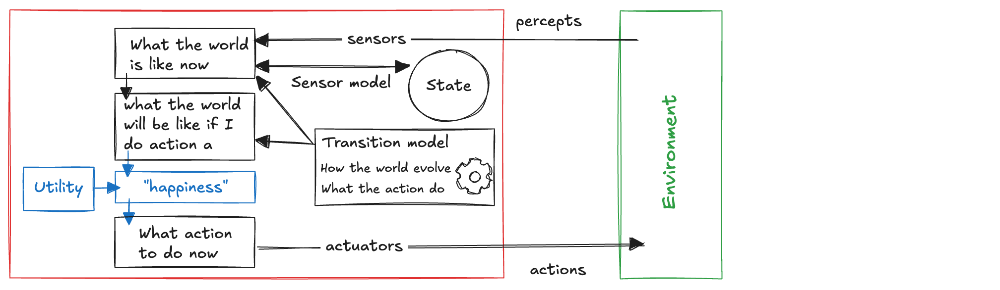

**Partial observability** and **non-determinism** are inherent in real-world environments, making decision-making under uncertainty essential. A rational utility-based agent selects actions that **maximize expected utility** (the utility it expects to obtain, on average, considering both the probability and desirability of each possible outcome). Building such agents is challenging and draws on research in perception, representation, reasoning, and learning. Moreover, finding the optimal action may itself require substantial computation. Because perfect rationality is often computationally impractical⁠￼, AI also studies [**bounded rationality**](./papers/(1997)%20-%20Rationality%20and%20Intelligence.pdf): choosing the best possible action given the computational resources available. Although many utility-based agents rely on an explicit model of the environment, model-free agents can instead learn which actions maximize utility directly from experience, without explicitly modeling how their actions affect the world.

### Learning agents

So far, we have explored different agent architectures, but not how these agents are created. [Turing (1950)](./papers/(1950)%20-%20Computing%20Machinery%20and%20Intelligence.pdf)⁠￼ considered **programming intelligent behavior by hand**, but recognized the limitations of this approach and advocated instead for **learning machines** that improve through experience. Today, learning is central to AI and can be incorporated into any agent architecture, whether model-based, goal-based, or utility-based. It enables agents to operate in initially unknown environments, adapt from experience, and eventually achieve capabilities beyond those provided by their initial knowledge. A **learning element** is responsible for improving the agent behavior, while a **performance element** (what we have previously considered to be the entire agent) selects actions based on percepts. Learning means modifying internal components (how the world works, the effects of their actions, their goals, etc.):

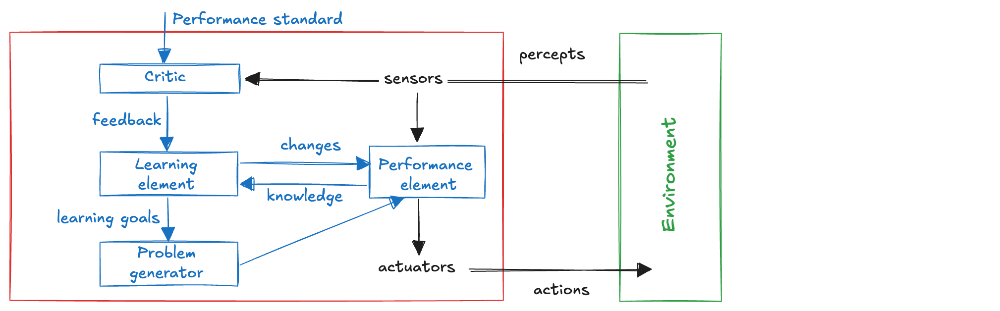

An agent can [**learn directly from experience**](./papers/(1959)%20-%20Some%20Studies%20in%20Machine%20Learning%20Using%20the%20Game%20of%20Checkers.pdf). For example, an autonomous vehicle may learn how braking behaves on different road surfaces. The **problem generator** goes one step further by encouraging exploration: it suggests actions that differ from those currently preferred by the performance element, allowing the agent to gain informative experiences and potentially discover better long-term strategies. The **critic** evaluates the agent’s behavior against a fixed performance standard and provides feedback, typically in the form of rewards or penalties. The learning element uses this feedback to determine how the performance element should be modified. This is essential because percepts alone do not indicate whether an outcome is desirable: a chess program may recognize checkmate, for example, but needs a performance standard to determine whether that checkmate represents a win or a loss. Whether hard-wired (like pain in humans) or learned from human behavior (like preferences provided by the user), this feedback drives the learning process. Ultimately, learning consists of **adapting the agent’s internal components from experience and feedback** so that its performance improves over time.

## An example: Flocking

In ["Flocks, Herds, and Schools: A Distributed Behavioral Model"](./papers/(1987)%20-%20Flocks,%20Herds,%20and%20Schools%20-%20A%20Distributed%20Behavioral%20Model.pdf) Reynolds presents a model simulating the collective behavior of animals like birds, fish, and ants. Reynolds introduces a model of such collective behavior (refered to as **flocking**), where each entity (a **boid**) follows simple local rules based on its environment, resulting in complex group motion. The model consists of three main rules:

- **Separation rule** avoids crowding neighbors to prevent agents from colliding
- **Cohesion rule** steers the agent towards the average position of neighbors, to keep agents together
- **Alignment rule** steers the agent towards the average heading of neighbors, to ensure agents move in the same direction

Each rule provides a **simple heuristic** for the agent to follow, based on the positions and velocities of nearby agents. The agent has a **limited perception range**, only considering neighbors within a certain radius.The rules determine how each entity moves at every instant by generating **competing acceleration requests** (forces):

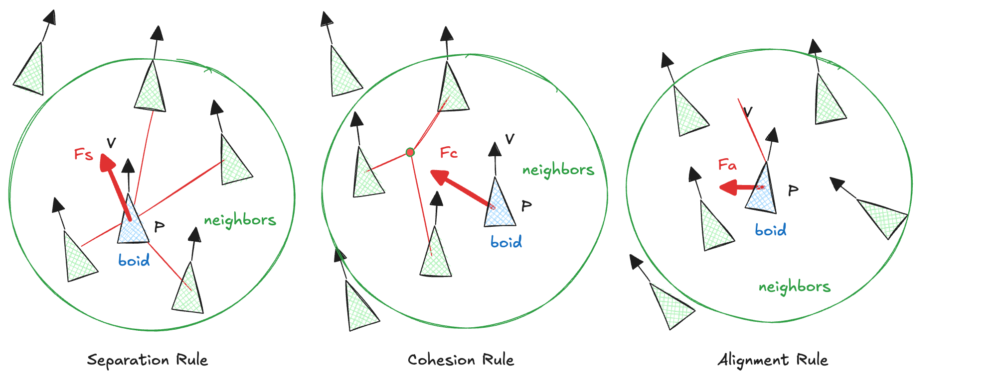

These forces are combined to compute the final force applied to an agent at each moment and to update its position and velocity exploiting a simplen **Euler integration rule**. Given a boid with position p(t), velocity v(t), and acceleration a(t), the Euler update is given by:

$\displaystyle \mathbf{v}(t + \Delta t) = \mathbf{v}(t) + \mathbf{a}(t) \Delta t$

$\displaystyle \mathbf{p}(t + \Delta t) = \mathbf{p}(t) + \mathbf{v}(t) \Delta t$

The acceleration a(t) is determined by the sum of various forces acting on the "boid":

$\displaystyle \mathbf{a}(t) = \frac{\mathbf{F}(t)}{m}$

where F(t) is the total force acting on the boid as a weighted sum of different flocking forces (alignment, cohesion, separation) and eventually other external force:

$\displaystyle \mathbf{F}(t) = w_{\text{align}} \mathbf{F}_{\text{align}} + w_{\text{cohesion}} \mathbf{F}_{\text{cohesion}} + w_{\text{separation}} \mathbf{F}_{\text{separation}} + \mathbf{F}_{\text{external}}$

This iterative update is applied at each simulation step, making the boids move dynamically according to the flocking rules. Different rules can be weighted to achieve different behaviors. The model is **decentralized**, meaning that each agent makes decisions based only on its local environment, without any global knowledge. 

We consider a simplified 2D implementation using the three main rules and a model-based agent architecture to implement the single boid. The agent maintains an internal state with its position and velocity, and updates them based on the flocking rules:

In [59]:
import numpy as np

def separation(boid, neighbors):
    # Initialize the force vector
    force = np.zeros(2)

    # If there are no neighbors, return the zero vector
    if not neighbors:
        return force

    # Loop over all neighbors
    for neighbor in neighbors:

        # Vector pointing from the neighbor to the agent, and its length
        offset = boid['position'] - neighbor['position']
        distance = np.linalg.norm(offset)

        # Skip a neighbor at (numerically) the same position: the steering
        # direction is undefined there, and dividing by distance would blow up
        if distance < 1e-6:
            continue

        # Push away from the neighbor, harder the closer it is: a unit vector
        # pointing away from the neighbor, scaled by 1/distance
        force += (offset / distance) * (1 / distance)

    # Cap the total
    length = np.linalg.norm(force)
    if length > 2:
        force = force / length * 2

    return force

In [60]:
def cohesion(boid, neighbors):
    # Initialize the force vector
    force = np.zeros(2)

    # If there are no neighbors, return the zero vector
    if not neighbors: 
        return force
    
    # Initialize the center of mass of neighbors
    center_of_mass = np.zeros(2)

    # Loop over all neighbors
    for neighbor in neighbors:
        # update the center of mass
        center_of_mass += neighbor['position'] 
    center_of_mass /= len(neighbors)

    # Steer towards the center of mass, capped so that a far-away flock
    # cannot pull the agent in with unbounded force
    force = center_of_mass - boid['position']

    # Cap the total
    length = np.linalg.norm(force)
    if length > 2:
        force = force / length * 2
    
    return force

In [61]:
def alignment(boid, neighbors):

    # Initialize the force vector
    force = np.zeros(2)

    # If there are no neighbors, return the zero vector
    if not neighbors: 
        return force

    # Initialize the average velocity of neighbors
    avg_velocity = np.zeros(2)

    # Loop over all neighbors
    for neighbor in neighbors:
        # Update the average velocity
        avg_velocity += neighbor['velocity']
    avg_velocity /= len(neighbors)

    # Calculate the force contribution as the difference between the agent's
    # velocity and the average velocity of its neighbors, capped so a large
    # mismatch cannot overpower the other rules
    force = avg_velocity - boid['velocity']

    # Cap the total
    length = np.linalg.norm(force)
    if length > 2:
        force = force / length * 2
    
    return force

In order to generate some overall flocking behavior, we can add a force contribution that steers the boid towards a target position. This can be made more complex by adding obstacles, predators, or other agents with different behaviors.

In [62]:
def direction(boid, target):

    # Vector from the agent to the target, and its length
    offset = target - boid['position']
    distance = np.linalg.norm(offset)

    # Already at the target: no direction to steer in
    if distance < 1e-6:
        return np.zeros(2)

    # A unit vector pointing towards the target: steer that way regardless
    # of how far away it is
    return offset / distance

Now we write the Euler integration funtion to update the state of a boid based on the percept, in that case the positions and velocities of the other boids:

In [63]:
def update_state(boid, percept, model):
    neighbors = percept['neighbors']

    # Calculate the forces (weights are applied here)
    separation_force = model['separation_force_factor'] * separation(boid, neighbors)
    alignment_force = model['alignment_force_factor']  * alignment(boid, neighbors)
    cohesion_force = model['cohesion_force_factor']  * cohesion(boid, neighbors)
    target_force = model['target_force_factor']  * direction(boid, model['target'])
    
    # Combine the forces
    force = separation_force + cohesion_force + alignment_force + target_force

    # Update the velocity (mass = 1, delta_t = 1). A damping factor slightly
    # below 1 acts as friction: without it the velocity is only ever pushed by
    # "force" and, combined with the hard speed limit below, tends to swing
    # between top speed in different directions instead of settling into a
    # smooth, coherent heading.
    boid['velocity'] = model.get('damping', 1.0) * boid['velocity'] + force
    
    # Speed Limiting (optional but often helpful)
    speed = np.linalg.norm(boid['velocity'])
    if speed > model['max_speed']:
        boid['velocity'] = (boid['velocity']/speed) * model['max_speed']

    # Update the position
    boid['position'] += boid['velocity']
    
    return boid

Now we can implement the model-based agent. In this simple case we just update the state without selecting any action based on the state. The behaviour can be made more complex by adding a goal or utility function to the agent.

In [64]:
def ModelBasedAgent(update_state, model):
    
    def program(percept):
        program.state = update_state(program.state, percept, model)
    
    program.state = {'position': 10 * np.random.rand(2), 'velocity': (np.random.rand(2) - 0.5)}
    return program

The perception of a boid is limited to a certain radius, so we need to filter the boids that are within this radius. This is the sensor function of our agent:

In [65]:
def sensors(boid, boids, radius):
    neighbors = []
    for other_boid in boids:
        if other_boid is not boid:  # Avoid self-comparison
            distance = np.linalg.norm(other_boid['position'] - boid['position'])
            if distance < radius:
                neighbors.append(other_boid)
    return neighbors

We need a function to simulate the environment, including time step updates and position visualization. Using Matplotlib and its animation module, we can generate a dynamic scatter plot to display boid positions at each time step:

In [66]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

def simulation(boids, model, num_frames):
    # Set up the figure and axis
    fig = plt.figure()
    ax = plt.axes(xlim=(-10, 100), ylim=(-10, 100))

    # Initialize positions for visualization
    positions = [boid.state['position'] for boid in boids]

    # Create a scatter plot
    scat = ax.scatter([pos[0] for pos in positions], [pos[1] for pos in positions])
    
    # Update the scatter plot each frame
    def update(frame):    
        # Loop over all boids
        for boid in boids:
            
            # Get the neighbors
            # neighbors = sensors(boid, boids, model)
            neighbors = sensors(boid.state, [b.state for b in boids], model['perception_radius'])

            # Prepare the percept
            percept = {'neighbors': neighbors}
            
            # Update the state of the boid
            boid(percept)
    
        # Update positions for visualization
        positions = [boid.state['position'] for boid in boids]
    
        # Update scatter plot data
        scat.set_offsets(positions)
    
        return scat,

    # Create animation
    anim = animation.FuncAnimation(fig, update, frames=num_frames, interval=50, blit=True)

    plt.close()

    return anim

Now we can experiment with different model parameters and weights to observe the emergent flocking behavior. For example, we can adjust the weights of the alignment, cohesion, and separation rules to observe how they affect the flocking dynamics. We can also introduce additional forces or rules to create more complex behaviors. The model-based agent architecture allows for easy modification and extension of the agent's behavior, making it a flexible framework for simulating intelligent agents.

In [67]:
# Define the model parameters
model = {'separation_force_factor': 1.2,
         'alignment_force_factor': 1.0,
         'cohesion_force_factor': 0.5,
         'target_force_factor': 0.5,
         'perception_radius': 10,
         'max_speed': 2.0,
         'damping': 0.95,
         'target': np.array([80, 80])} 

# Define the number of agents
num_agents = 30

# Define the number of frames
num_frames = 200

# Create a first set of boids
boids = [ModelBasedAgent(update_state, model) for _ in range(num_agents)]

# Run the simulation
anim = simulation(boids, model, num_frames)

anim

The model has been widely used in computer graphics, animation, and robotics to simulate realistic group motion.